In [76]:
import warnings
import numpy as np
import pandas as pd
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', 150)  # display all column of dataframe
pd.set_option('display.max_row', 100)     # display 100 rows of the dataframe
pd.set_option('display.max_colwidth', -1) # display all values within cells
pd.set_option('display.float_format', '{:.10f}'.format)
import sklearn
# logistic regression for feature importance
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns 
from scipy.stats import kstest
from scipy import stats
from sklearn import model_selection
from sklearn import linear_model
from sklearn import metrics
from functools import reduce
from sklearn.decomposition import PCA
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import plot_confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import roc_auc_score,confusion_matrix, classification_report

In [2]:
from imblearn.over_sampling import SMOTE

In [3]:
def Distribution_plot(dataframe,feature, target, title, xlabel):
    """"
    Plot Distribution of feature for both classes
    
    Parameters
    ------------
    dataframe: Training dataframe
    feature: Variable to find distribution
    target: Dependent variable column containing all classes
    title: Plot title
    """
    
    # set the figure size
    plt.figure(figsize=(10,8))

    ax = plt.subplot()
    #distribution plot for all classes
    sns.distplot(dataframe[feature][dataframe[target] == 0], bins=50, label="Deprived Area")
    sns.distplot(dataframe[feature][dataframe[target] ==1], bins=50, label="Developed Area")
    sns.distplot(dataframe[feature][dataframe[target] ==2], bins=50, label="Water Area")

    plt.title(title, fontsize=14)
    plt.xlabel(xlabel)

    # Add legend and show plot
    ax.legend(title="Area classification")
    plt.show()
    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)        


    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [4]:
#read data
df = pd.read_csv('Contextual_Features_final.csv')

# Data Overview

In [5]:
#view imported data to see which columns needed to be removed
df.head()

,long_x,lat_x,Label_x,Point,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,long_y,lat_y,Label_y,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,...,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,long,lat,Label,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,3.2041666690,6.9116668400,0,1,0.0000000000,0.2700303285,14.3400000000,5.8600000000,1.5605352609,1.3571174461,3.6840173970,3.0622886280,0.0000000000,0.4450898083,0.0000000000,0.4393513149,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.6696591166,2.3767978600,0.0297030714,155.9430564400,2.9936234700,5.7093206350,0.2890089718,0.0000000000,19.2936329110,0.0000000000,0.0000000000,0.0009225654,0.0000000000,1.9259881459,0.6783329560,23.3608649030,0.5526671735,1.9196933109,26.3800000000,0.0000000000,0.0000000000,3.7708017440,1.2168429960,0.6850358957,0.2135762563,0.0613977521,7.2355880560,3.2041666688,6.9116668404,0,61.4551483200,21.7459551400,69.5262565100,21.5813566000,74.9410080100,21.3992938700,11.9917303810,0.6667498806,11.9924461410,0.7096281644,11.9693735500,0.7042853254,0.7103381489,11.9945281920,0.6661052694,11.9968413510,0.6582763655,11.9977100210,0.6888771717,11.9912195610,11.9950388960,0.6877209277,7.9470801460,...,23.4860506950,23.5585811200,7.9543920290,23.3356346400,7.9508512890,23.3095601850,7.9581975980,23.3462561450,7.9450535260,7.9486371390,23.6986007600,5.9236401820,49.4942105500,5.8894272300,49.1101993300,5.8523924770,49.7633514700,50.7046440700,5.9332592540,49.5953933000,5.9477596140,49.5806863800,5.9509599160,49.8517311700,5.9298494370,5.9126846020,51.7492199000,20306.1108540000,0.5916397085,0.1011072928,869.3649034000,0.0530579663,151342.2376700000,0.4108726155,0.1

In [6]:
df.describe()

,long_x,lat_x,Label_x,Point,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,long_y,lat_y,Label_y,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,...,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,long,lat,Label,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
count,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,...,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,

In [7]:
# check shape of data
df.shape

(47560, 154)

In [8]:
#clean up data by removing joined columns
df= df.drop(columns= ['long_x','lat_x','Label_x','long_y','lat_y','Label_y'])
cols_to_move = ['lat','long','Label','Point']
df = df[ cols_to_move + [ col for col in df.columns if col not in cols_to_move ]]
target = 'Label'
first_col = df.pop(target)
df.insert(0, target,  first_col)
df.head()

,Label,lat,long,Point,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,0,6.9116668404,3.2041666688,1,0.0000000000,0.2700303285,14.3400000000,5.8600000000,1.5605352609,1.3571174461,3.6840173970,3.0622886280,0.0000000000,0.4450898083,0.0000000000,0.4393513149,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.6696591166,2.3767978600,0.0297030714,155.9430564400,2.9936234700,5.7093206350,0.2890089718,0.0000000000,19.2936329110,0.0000000000,0.0000000000,0.0009225654,0.0000000000,1.9259881459,0.6783329560,23.3608649030,0.5526671735,1.9196933109,26.3800000000,0.0000000000,0.0000000000,3.7708017440,1.2168429960,0.6850358957,0.2135762563,0.0613977521,7.2355880560,61.4551483200,21.7459551400,69.5262565100,21.5813566000,74.9410080100,21.3992938700,11.9917303810,0.6667498806,11.9924461410,0.7096281644,11.9693735500,0.7042853254,0.7103381489,11.9945281920,0.6661052694,11.9968413510,0.6582763655,11.9977100210,0.6888771717,11.9912195610,11.9950388960,0.6877209277,7.9470801460,23.3234070100,7.9370275580,23.4020880650,7.9176978860,23.4860506950,23.5585811200,7.9543920290,23.3356346400,7.9508512890,23.3095601850,7.9581975980,23.3462561450,7.9450535260,7.9486371390,23.6986007600,5.9236401820,49.4942105500,5.8894272300,49.1101993300,5.8523924770,49.7633514700,50.7046440700,5.9332592540,49.5953933000,5.9477596140,49.5806863800,5.9509599160,49.8517311700,5.9298494370,5.9126846020,51.7492199000,20306.1108540000,0.5916397085,0.1011072928,869.36

In [9]:
def count_values_in_column(data,feature):
    total=data.loc[:,feature].value_counts(dropna=False)
    percentage=round(data.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
    return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])
#Count_values for sentiment
pie_data= count_values_in_column(df,"Label") # save data aS a dataframe
count_values_in_column(df,"Label")

,Total,Percentage
2,32089,67.4700000000
0,15202,31.9600000000
1,269,0.5700000000


<function matplotlib.pyplot.show(close=None, block=None)>

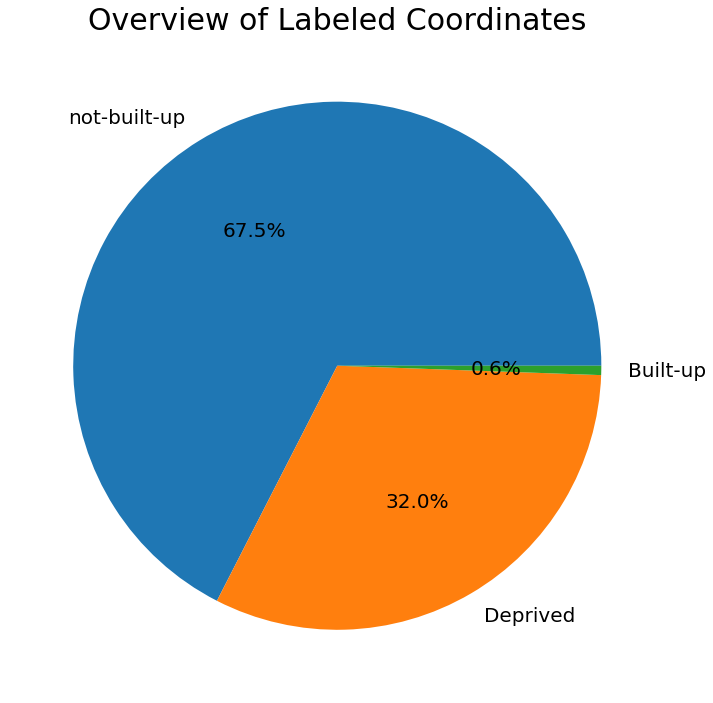

In [10]:
plt.figure(figsize=(10,10))
labels = ['not-built-up','Deprived','Built-up']
plt.title('Overview of Labeled Coordinates', fontsize=30)
plt.pie(pie_data['Total'], labels=labels, autopct='%1.1f%%', textprops={'fontsize': 20})
plt.rcParams["axes.labelweight"] = "bold"
plt.tight_layout()
plt.show

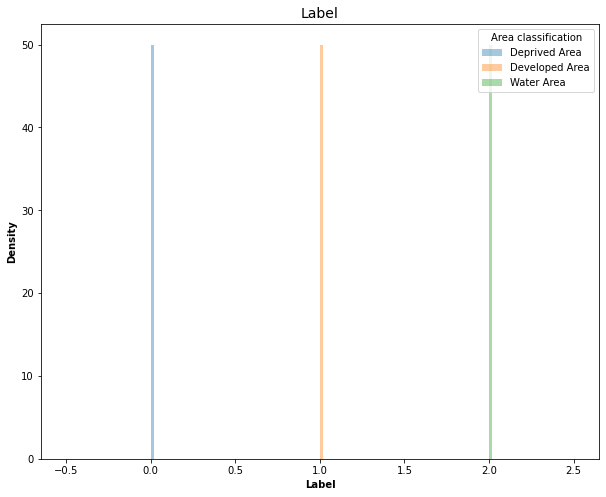

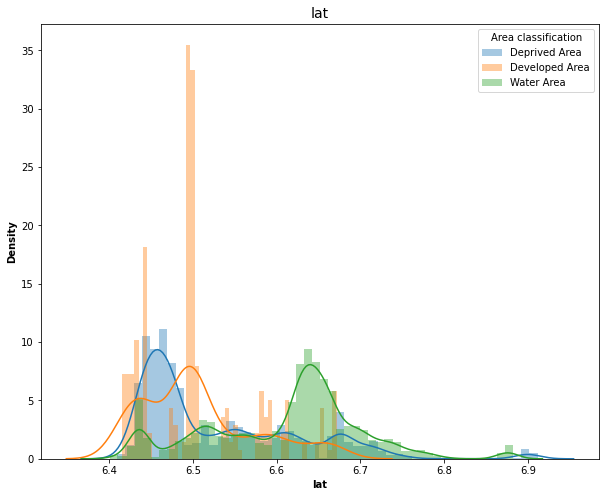

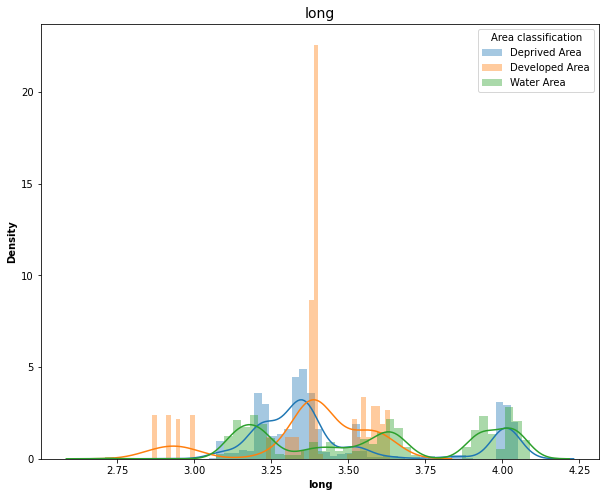

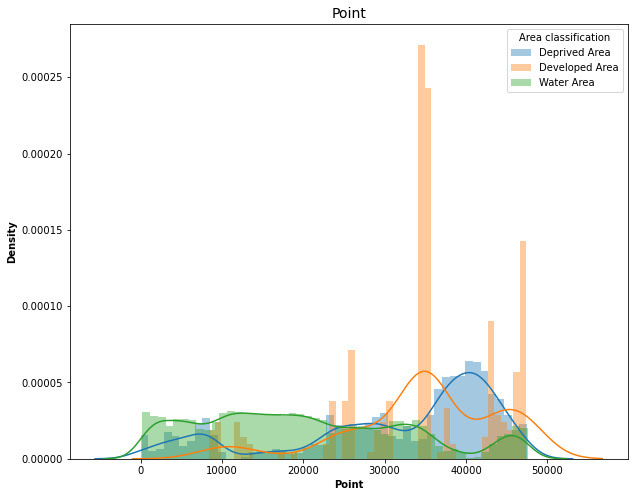

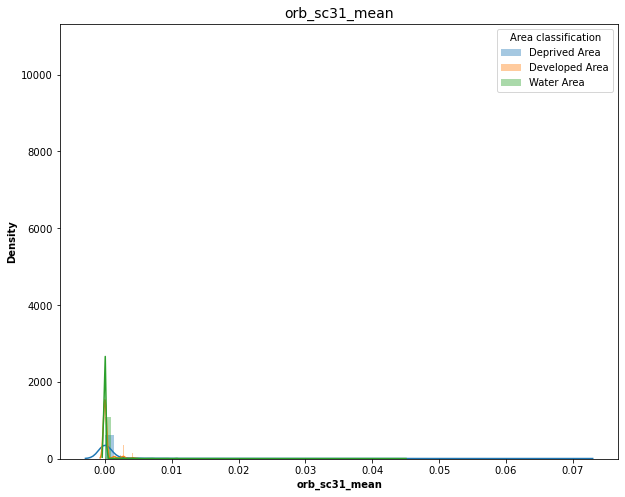

...

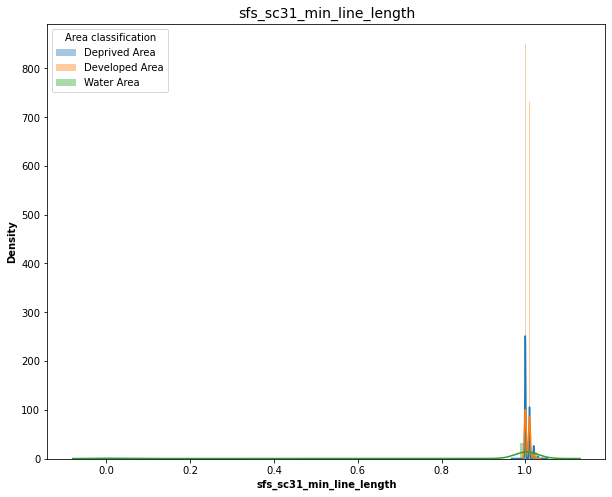

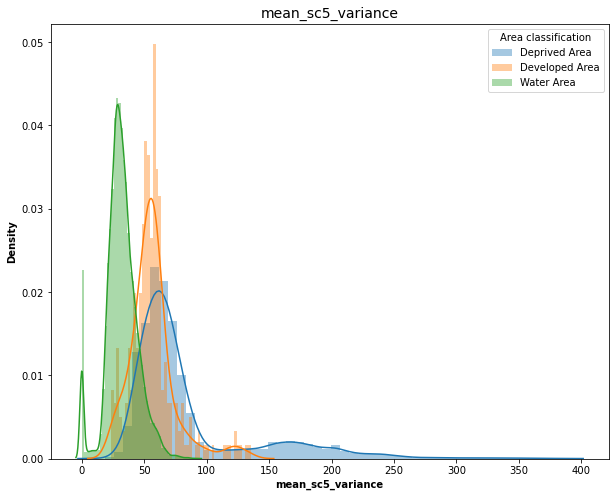

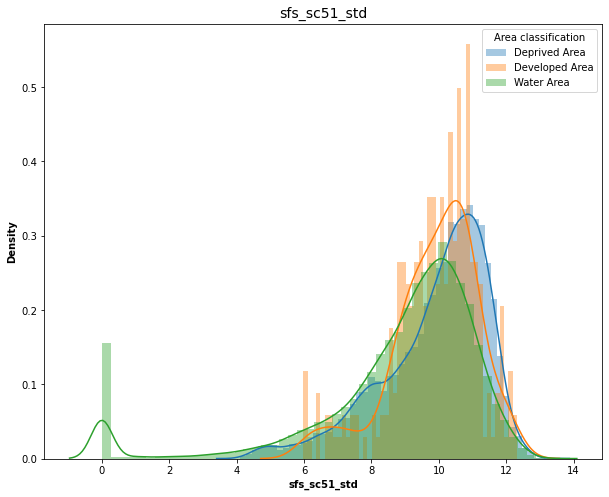

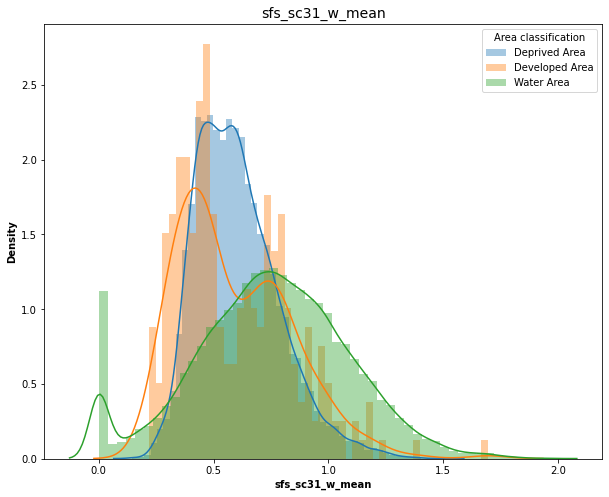

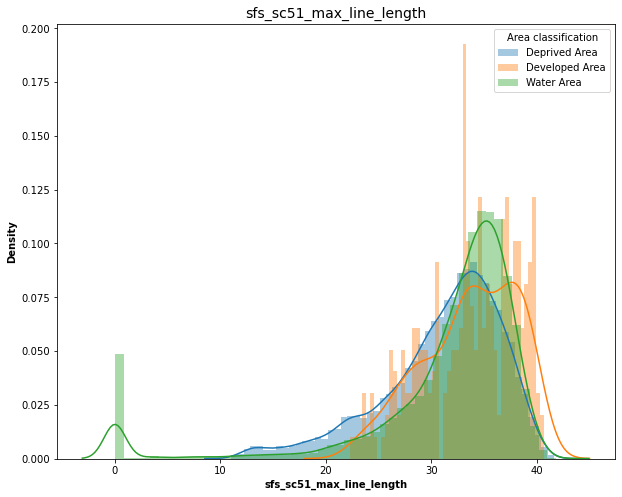

In [11]:
# Overview of distribution plots for 
for i in df.columns:
    Distribution_plot(df, "{}".format(i), "Label", "{}".format(i), "{}".format(i))

In [13]:
x_t = df.iloc[:, 4:] #x data
y_t= df[['Label']] # y data

In [14]:
# split data into train and test
#x = df.iloc[:, 4:]
#y= df[['Label']]
#x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.20,random_state=42) #brad
X_train, X_test, Y_train, Y_test = train_test_split(x_t,y_t, test_size=0.20,random_state=42) #Jake
Y_train= Y_train.reset_index(drop=True)
Y_test = Y_test.reset_index(drop=True)
print('X_train dimension= ', X_train.shape)
print('X_test dimension= ', X_test.shape)
print('Y_train dimension= ', Y_train.shape)
print('Y_train dimension= ', Y_test.shape)

X_train dimension=  (38048, 144)
X_test dimension=  (9512, 144)
Y_train dimension=  (38048, 1)
Y_train dimension=  (9512, 1)


# Normality Checks on Contextual Features


In this section the Kolmogorov–Smirnov test was utilized to assess the normailty of the 144 contextual features. None of the features were found to be normally distributed 

In [15]:
# Check Normality of each Variabes
Norm= []
Norm_col = []
for col in X_train:
    Norm_col.append(col)
    Norm.append(kstest(X_train[col],'norm'))
norm = pd.DataFrame (Norm, columns = ['Statistics','p-value'])
norm_col= pd.DataFrame (Norm_col, columns = ['contextual_feature'])
normal_check = norm_col.merge(norm, left_index=True, right_index=True)

In [16]:
#get column names of Contextual Features
Names = []
for i in x_t:
    Names.append(i)
names = pd.DataFrame (Names, columns = ['Contextual_features'])
names.head()

,Contextual_features
0,orb_sc31_mean
1,lbpm_sc7_skew
2,lbpm_sc5_max
3,lbpm_sc3_max
4,lbpm_sc5_skew


In [17]:
normal_check.head(144) # none of the values appear normally distributed

,contextual_feature,Statistics,p-value
0,orb_sc31_mean,0.5000000000,0.0000000000
1,lbpm_sc7_skew,0.5001963983,0.0000000000
2,lbpm_sc5_max,0.9585473880,0.0000000000
3,lbpm_sc3_max,0.9519602774,0.0000000000
4,lbpm_sc5_skew,0.7849936145,0.0000000000
...,...,...,...
139,sfs_sc31_min_line_length,0.7945617351,0.0000000000
140,mean_sc5_variance,0.9714302683,0.0000000000
141,sfs_sc51_std,0.9669876058,0.0000000000
142,sfs_sc31_w_mean,0.5514554052,0.0000000000


In [18]:
# plot correlation matrix
plt.figure(figsize=(150, 150))
plt.title('Correlation Heat Map', fontsize= 250)
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, cmap='YlOrRd', square=True)

<AxesSubplot:title={'center':'Correlation Heat Map'}>

In [159]:
df.corr()

,Label,lat,long,Point,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
Label,1.0000000000,0.3782716119,0.1718710753,-0.3812718078,-0.2135527608,-0.4277963158,-0.0377342244,-0.0623098573,-0.3905775232,0.1036950165,-0.1837325544,-0.1754169914,-0.2153118424,-0.1890478680,-0.1849804576,0.6001485840,-0.2433089525,-0.2094061311,-0.1697950854,-0.1565939486,-0.2320185610,-0.1220998045,-0.3168494687,-0.1616070423,0.6254239175,-0.3269472748,-0.1805636485,-0.4204165326,0.6003574712,-0.1537208337,-0.3046837410,-0.1702278310,-0.2180027328,0.0388219132,-0.2221611655,-0.1661386673,-0.3296972160,0.1963254077,-0.4613000146,-0.1748602212,-0.0444661238,-0.2049563630,-0.2318752522,-0.1796237759,-0.1620685165,-0.3342663894,0.6005023449,0.6274003146,0.1812968667,-0.4141847018,-0.4713772983,-0.3658730657,-0.4672290602,-0.3373022976,-0.4645696944,-0.6559405424,-0.6058408465,-0.6560264677,-0.6027211922,-0.6562282072,-0.6022211345,-0.6105129173,-0.6558565706,-0.6119579889,-0.6558071098,-0.6096964160,-0.6557799523,-0.6079404455,-0.6558590839,-0.6561235750,-0.6080287640,-0.6552406954,-0.6201926189,-0.6553474701,-0.6203246405,-0.6558483508,-0.6210161454,-0.6216594456,-0.6548390683,-0.6212931075,-0.6544313273,-0.6208994991,-0.6543452775,-0.6204585835,-0.6547263690,-0.6555661399,-0.6218620360,-0.6543151434,-0.6177185104,-0.6545469271,-0.6187279502,-0.6557419266,-0.6202624959,-0.6204095850,-0.6536418561,-0.6199124725,-0.6527036894,-0.6191819749,-0.6521790253,-0.6179460857,-0.6530975

# Feature Selection

feature reduction techniques of bi-serial correlation, PCA, logistic regression, decission tree, random forest, and svm were explored to reduce the number of features

## Bi-serial Correlation on Label


Bi-serial correlation was implemented to see if there was any correlation between the contextual features and the three categorical labels 

In [21]:
#convereted y variables into three columns of dummy variables
Y_t= Y_train['Label']
Y = pd.get_dummies(Y_t)
Y = Y.rename(columns={0:'Deprived_Areas',1:'Built-Up-Areas',2:'Not-Built-up'})
Y.head()

,Deprived_Areas,Built-Up-Areas,Not-Built-up
0,0,0,1
1,0,0,1
2,0,0,1
3,1,0,0
4,0,0,1


In [25]:
# split each of the columns into their own dataframes 
y_train_0 = Y['Deprived_Areas']
y_train_1 = Y['Built-Up-Areas']
y_train_2 = Y['Not-Built-up']

In [28]:
val_0 = []
val_1 = []
val_2 = []
corr_0 = []
corr_1 = []
corr_2 = []

for col in X_train:
    val_0.append(col)
    corr_0.append(stats.pointbiserialr(X_train[col],y_train_0))
Val_0 = pd.DataFrame (val_0, columns = ['Contextual_Feature'])
Corr_0 = pd.DataFrame (corr_0, columns = ['correlation_0', 'p-value_0'])
Ex_0 = pd.merge(Val_0,Corr_0, left_index=True, right_index=True)
Ex_0 = Ex_0.sort_values('p-value_0', ascending=False)
Ex_0 = Ex_0.drop_duplicates().reset_index(drop=True)

In [29]:
for col in X_train:
    val_1.append(col)
    corr_1.append(stats.pointbiserialr(X_train[col],y_train_1))
Val_1 = pd.DataFrame (val_1, columns = ['Contextual_Feature'])
Corr_1 = pd.DataFrame (corr_1, columns = ['correlation_1', 'p-value_1'])
Ex_1 = pd.merge(Val_1,Corr_1, left_index=True, right_index=True)
Ex_1 = Ex_1.sort_values('p-value_1', ascending=False)
Ex_1= Ex_1.drop_duplicates().reset_index(drop=True)

In [30]:
for col in X_train:
    val_2.append(col)
    corr_2.append(stats.pointbiserialr(X_train[col],y_train_2))
Val_2 = pd.DataFrame (val_2, columns = ['Contextual_Feature'])
Corr_2 = pd.DataFrame (corr_2, columns = ['correlation_2', 'p-value_2'])
Ex_2 = pd.merge(Val_2,Corr_2, left_index=True, right_index=True)
Ex_2 = Ex_2.sort_values('p-value_2', ascending=False)
Ex_2= Ex_2.drop_duplicates().reset_index(drop=True)

In [31]:
Ex_final_0 = Ex_0.merge(Ex_1, left_on=['Contextual_Feature'], right_on=['Contextual_Feature'])
Ex_final = Ex_final_0.merge(Ex_2, left_on=['Contextual_Feature'], right_on=['Contextual_Feature'])
Ex_final.head()

,Contextual_Feature,correlation_0,p-value_0,correlation_1,p-value_1,correlation_2,p-value_2
0,hog_sc5_max,0.0151947189,0.0030372764,-0.0077525866,0.1304869196,-0.0138715051,0.0068139515
1,sfs_sc51_max_line_length,-0.0308801727,0.0000000017,0.0226563778,0.0000098814,0.0270764425,0.0000001276
2,lbpm_sc5_max,0.0322589642,0.0000000003,0.0188941159,0.0002280976,-0.0351596978,0.0000000000
3,lbpm_sc7_max,0.0385507459,0.0000000000,0.0235885382,0.0000041917,-0.0421802552,0.0000000000
4,hog_sc7_max,-0.0399153927,0.0000000000,-0.0157786864,0.0020848954,0.0422771320,0.0000000000


In [32]:
Ex_final.sort_values('p-value_0',ascending = False).head() #no values were significant on the 0 variable

,Contextual_Feature,correlation_0,p-value_0,correlation_1,p-value_1,correlation_2,p-value_2
0,hog_sc5_max,0.0151947189,0.0030372764,-0.0077525866,0.1304869196,-0.0138715051,0.0068139515
1,sfs_sc51_max_line_length,-0.0308801727,0.0000000017,0.0226563778,0.0000098814,0.0270764425,0.0000001276
2,lbpm_sc5_max,0.0322589642,0.0000000003,0.0188941159,0.0002280976,-0.0351596978,0.0000000000
3,lbpm_sc7_max,0.0385507459,0.0000000000,0.0235885382,0.0000041917,-0.0421802552,0.0000000000
4,hog_sc7_max,-0.0399153927,0.0000000000,-0.0157786864,0.0020848954,0.0422771320,0.0000000000


In [35]:
#43 variables were found to be significant on predicting water areas
var_import = Ex_final.sort_values('p-value_1',ascending = False).reset_index(drop=True)
var_import.head()

,Contextual_Feature,correlation_0,p-value_0,correlation_1,p-value_1,correlation_2,p-value_2
0,lbpm_sc3_variance,-0.1079625705,0.0000000000,0.0000223128,0.9965274890,0.1074539515,0.0000000000
1,lac_sc5_lac,0.5317367798,0.0000000000,0.0001060781,0.9834923022,-0.5292666140,0.0000000000
2,lbpm_sc5_variance,-0.1858585955,0.0000000000,0.0005648977,0.9122628623,0.1848979692,0.0000000000
3,sfs_sc71_max_line_length,-0.2699943495,0.0000000000,0.0006824667,0.8941009308,0.2686211735,0.0000000000
4,orb_sc71_skew,0.1684593800,0.0000000000,-0.0026481249,0.6054881751,-0.1672436750,0.0000000000


In [36]:
#top 10 values according to biserial correlation
# note: p-values appeared very high for these values
best_bi_serial=var_import[['Contextual_Feature']]
print(var_import[['Contextual_Feature']][0:10])

         Contextual_Feature
0  lbpm_sc3_variance       
1  lac_sc5_lac             
2  lbpm_sc5_variance       
3  sfs_sc71_max_line_length
4  orb_sc71_skew           
5  lbpm_sc7_variance       
6  lsr_sc31_line_length    
7  orb_sc51_skew           
8  gabor_sc3_filter_14     
9  pantex_sc5_min          


## Feature Scaling

Needed to include feature scaling for model assessment 

In [37]:
sc = StandardScaler()
X_scaled = sc.fit_transform(x_t)
sc.fit(X_train)
X_train_scaled = sc.transform(X_train)
X_test_scaled = sc.transform(X_test)

## PCA feature selection

In [40]:
pca = PCA() # estimate only 2 PCs
X_new = pca.fit_transform(X_train_scaled)

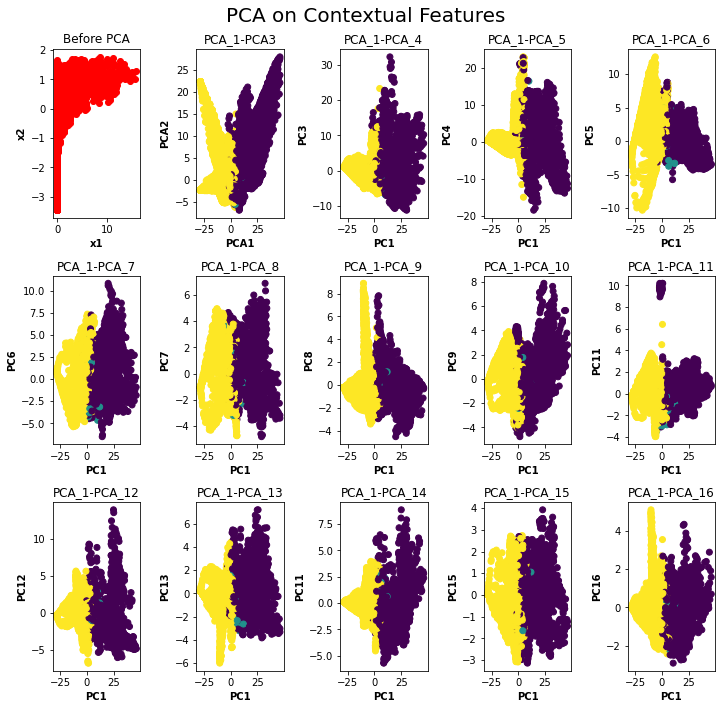

In [41]:
import itertools
colors = itertools.cycle(['#FF0000', "#0000FF", "#00FF00"])
fig, axes = plt.subplots(3,5,figsize=(10,10))
fig.suptitle('PCA on Contextual Features', fontsize= 20)
axes[0,0].scatter(X_train_scaled[:,0], X_train_scaled[:,1], c=next(colors), label= labels)
axes[0,0].set_xlabel('x1')
axes[0,0].set_ylabel('x2')
axes[0,0].set_title('Before PCA')
axes[0,1].scatter(X_new[:,0], X_new[:,1], c=Y_train.values, label= labels)
axes[0,1].set_xlabel('PC1')
axes[0,1].set_ylabel('PC2')
axes[0,1].set_title('PCA1-PCA2')
axes[0,1].scatter(X_new[:,0], X_new[:,2], c=Y_train.values, label= labels)
axes[0,1].set_xlabel('PCA1')
axes[0,1].set_ylabel('PCA2')
axes[0,1].set_title('PCA_1-PCA3')
axes[0,2].scatter(X_new[:,0], X_new[:,3], c=Y_train.values, label= labels)
axes[0,2].set_xlabel('PC1')
axes[0,2].set_ylabel('PC3')
axes[0,2].set_title('PCA_1-PCA_4')
axes[0,3].scatter(X_new[:,0], X_new[:,4], c=Y_train.values, label= labels)
axes[0,3].set_xlabel('PC1')
axes[0,3].set_ylabel('PC4')
axes[0,3].set_title('PCA_1-PCA_5')
axes[0,4].scatter(X_new[:,0], X_new[:,5], c=Y_train.values, label= labels)
axes[0,4].set_xlabel('PC1')
axes[0,4].set_ylabel('PC5')
axes[0,4].set_title('PCA_1-PCA_6')
axes[1,0].scatter(X_new[:,0], X_new[:,6], c=Y_train.values, label= labels)
axes[1,0].set_xlabel('PC1')
axes[1,0].set_ylabel('PC6')
axes[1,0].set_title('PCA_1-PCA_7')
axes[1,1].scatter(X_new[:,0], X_new[:,7], c=Y_train.values, label= labels)
axes[1,1].set_xlabel('PC1')
axes[1,1].set_ylabel('PC7')
axes[1,1].set_title('PCA_1-PCA_8')
axes[1,2].scatter(X_new[:,0], X_new[:,8], c=Y_train.values, label= labels)
axes[1,2].set_xlabel('PC1')
axes[1,2].set_ylabel('PC8')
axes[1,2].set_title('PCA_1-PCA_9')
axes[1,3].scatter(X_new[:,0], X_new[:,9], c=Y_train.values, label= labels)
axes[1,3].set_xlabel('PC1')
axes[1,3].set_ylabel('PC9')
axes[1,3].set_title('PCA_1-PCA_10')
axes[1,4].scatter(X_new[:,0], X_new[:,11], c=Y_train.values, label= labels)
axes[1,4].set_xlabel('PC1')
axes[1,4].set_ylabel('PC11')
axes[1,4].set_title('PCA_1-PCA_11')
axes[2,0].scatter(X_new[:,0], X_new[:,12], c=Y_train.values, label= labels)
axes[2,0].set_xlabel('PC1')
axes[2,0].set_ylabel('PC12')
axes[2,0].set_title('PCA_1-PCA_12')
axes[2,1].scatter(X_new[:,0], X_new[:,13], c=Y_train.values, label= labels)
axes[2,1].set_xlabel('PC1')
axes[2,1].set_ylabel('PC13')
axes[2,1].set_title('PCA_1-PCA_13')
axes[2,2].scatter(X_new[:,0], X_new[:,14], c=Y_train.values, label= labels)
axes[2,2].set_xlabel('PC1')
axes[2,2].set_ylabel('PC11')
axes[2,2].set_title('PCA_1-PCA_14')
axes[2,3].scatter(X_new[:,0], X_new[:,15], c=Y_train.values, label= labels)
axes[2,3].set_xlabel('PC1')
axes[2,3].set_ylabel('PC15')
axes[2,3].set_title('PCA_1-PCA_15')
axes[2,4].scatter(X_new[:,0], X_new[:,16], c=Y_train.values, label= labels)
axes[2,4].set_xlabel('PC1')
axes[2,4].set_ylabel('PC16')
axes[2,4].set_title('PCA_1-PCA_16')
plt.tight_layout()
plt.show()

In [42]:
# identify number of features needed to reach 95% threshold
total_explained_variance = pca.explained_variance_ratio_.cumsum()
n_over_95 = len(total_explained_variance[total_explained_variance >= .95])
n_to_reach_95 = abs(X_new.shape[1] - n_over_95 + 1)
print("Number features: {}\tTotal Variance Explained: {}".format(n_to_reach_95, total_explained_variance[n_to_reach_95-1]))

Number features: 13	Total Variance Explained: 0.9534972744954948


In [43]:
#create pipe line for selecting features
pipe = Pipeline([('scaler', StandardScaler()),
 ('pca', PCA(n_components=144,random_state=123)),
 ('clf', RandomForestClassifier())])
pipe.fit(X_train,Y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('pca', PCA(n_components=144, random_state=123)),
                ('clf', RandomForestClassifier())])

In [44]:
#show cumulative variance explained for first 13 components
pca.explained_variance_ratio_.cumsum()[0:13]

array([0.50548819, 0.7189443 , 0.78736557, 0.83934874, 0.86360452,
       0.88672985, 0.90566304, 0.9173738 , 0.92701832, 0.9346528 ,
       0.94156102, 0.94766257, 0.95349727])

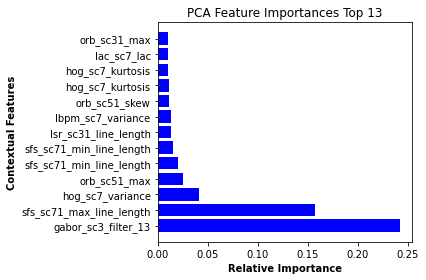

In [45]:
#selecting features from PCA
model = pipe.steps[1][1]
n_pcs= model.components_.shape[0]
initial_feature_names = X_train.columns
# loop through the absolute value of 144 pca components in model and select the largest value
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_pcs)] 
# create list of most important features
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
# run values through random forest to extract feature importance 
zipped_feats = zip(most_important_names, pipe.steps[2][1].feature_importances_)
#sort feature importance values
zipped_feats = sorted(zipped_feats, key=lambda x: x[1], reverse=True)
features, importances = zip(*zipped_feats)
top_features = features[:13]
top_importances = importances[:13]
plt.figure()
plt.title('PCA Feature Importances Top 13')
plt.barh(range(len(top_importances)), top_importances, color='b', align='center')
plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

In [48]:
#Convert top features into a dataframe
top_pca_names = pd.DataFrame(features)
top_pca_values = pd.DataFrame(importances)
top_pca = top_pca_names.merge(top_pca_values, left_index=True,right_index=True)
top_pca= top_pca.rename(columns={'0_x':'names','0_y':'values'})
top_pca.to_csv('best_pca_features.csv',index=False)
top_pca.head()

,names,values
0,gabor_sc3_filter_13,0.2420642272
1,sfs_sc71_max_line_length,0.1573266089
2,hog_sc7_variance,0.0414379286
3,orb_sc51_max,0.0251129670
4,sfs_sc71_min_line_length,0.0198164493


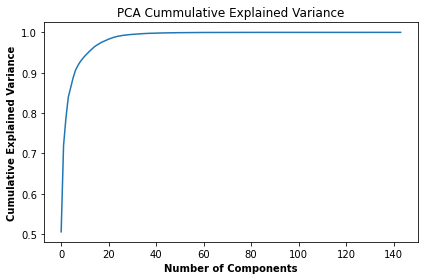

In [49]:
#plot cummulative explained variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA Cummulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.tight_layout()
plt.show()

# Full Logist Model

In [51]:
lm = LogisticRegression(penalty='l1',random_state=123, solver='liblinear')
# fit the model
lm.fit(X_train_scaled, Y_train)
y_pred_lm= lm.predict(X_test_scaled)

<AxesSubplot:>

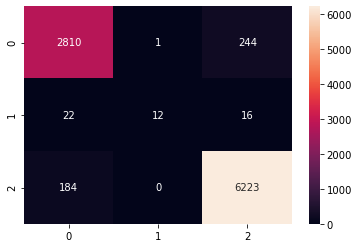

In [52]:
sns.heatmap(confusion_matrix(Y_test,y_pred_lm), annot=True, fmt='d')

In [53]:
print(classification_report(Y_test, lm.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      3055
           1       0.92      0.24      0.38        50
           2       0.96      0.97      0.97      6407

    accuracy                           0.95      9512
   macro avg       0.94      0.71      0.76      9512
weighted avg       0.95      0.95      0.95      9512



In [54]:
#organize importance by coefficients
importance = lm.coef_[0]
Feat_num = []
Score = []
for i,v in enumerate(importance):
    Feat_num.append(i)
    Score.append(v)
feat_num = pd.DataFrame (Feat_num, columns = ['feature_number'])
score = pd.DataFrame (Score, columns = ['score'])

In [55]:
metrics_1 = names.merge(feat_num, left_index=True, right_index=True)
metrics = metrics_1.merge(score, left_index=True, right_index=True)
metrics['values'] = metrics['score'].abs()
best_logistic= metrics.sort_values('values', ascending=False).reset_index(drop=True)
best_logistic.to_csv('logistic_feature_importance.csv',index=False)
best_logistic.head()

,Contextual_features,feature_number,score,values
0,gabor_sc7_filter_13,87,6.9462995674,6.9462995674
1,gabor_sc7_filter_14,88,6.5330829333,6.5330829333
2,lbpm_sc7_max,36,-6.1871378061,6.1871378061
3,gabor_sc5_filter_8,79,-5.5752222993,5.5752222993
4,fourier_sc71_mean,49,-5.3389038113,5.3389038113


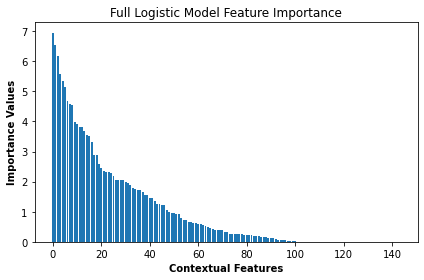

In [56]:
# plot feature importance
plt.figure()
plt.title('Full Logistic Model Feature Importance')
plt.bar([x for x in range(len(importance))], best_logistic['values'])
plt.xlabel('Contextual Features')
plt.ylabel('Importance Values')
plt.tight_layout()
plt.show()

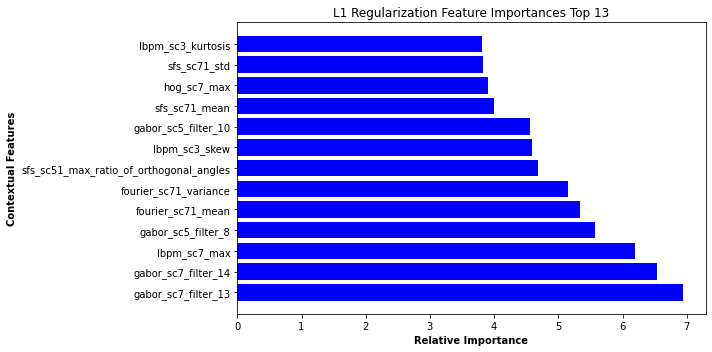

In [58]:
plt.figure(figsize=(10,5))
plt.title('L1 Regularization Feature Importances Top 13')
plt.barh(best_logistic['Contextual_features'][:13],best_logistic['values'][:13], color='b')
#plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

##  Gradient Boosting

In [60]:
gb_clf = GradientBoostingClassifier(n_estimators=100, learning_rate=0.02, random_state=123)
gb_clf.fit(X_train_scaled, Y_train)

# Gradient Boosting Predictions
gb_pred = gb_clf.predict(X_test_scaled)
gb_score = gb_clf.predict_proba(X_test_scaled)

In [61]:
# Gradient Boosting Results
print("Results Using Gradient Boosting & All Features")
print(classification_report(Y_test,gb_pred))

Results Using Gradient Boosting & All Features
              precision    recall  f1-score   support

           0       0.93      0.87      0.90      3055
           1       1.00      0.10      0.18        50
           2       0.94      0.97      0.95      6407

    accuracy                           0.93      9512
   macro avg       0.95      0.65      0.68      9512
weighted avg       0.93      0.93      0.93      9512



<AxesSubplot:>

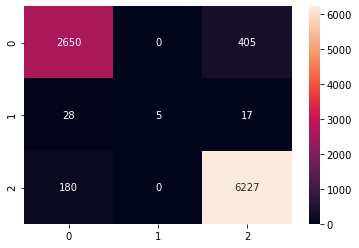

In [62]:
sns.heatmap(confusion_matrix(Y_test,gb_pred), annot=True, fmt='d')

##  Decsion Tree


In [64]:
model_tr = DecisionTreeRegressor(random_state=123)
model_tr.fit(X_train_scaled, Y_train)
feat_importances = pd.Series(model_tr.feature_importances_, index=x_t.columns)

In [65]:
#feature selection for Decision trees
feat_importances= feat_importances.sort_values(ascending=False)
feat_importances= feat_importances.to_frame()
feat_importances= feat_importances.rename(columns={0:'Values'})
feat_importances.to_csv('Decision_Tree_values.csv')
feat_importances.head()

,Values
gabor_sc7_filter_13,0.5908373917
ndvi_sc3_mean,0.0475833381
gabor_sc7_filter_14,0.0345518929
hog_sc5_max,0.0234227842
lsr_sc51_line_mean,0.0188442084


In [66]:
test_pred_dt = model_tr.predict(X_test_scaled)

In [67]:
print(classification_report(Y_test,test_pred_dt))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      3055
           1       0.54      0.50      0.52        50
           2       0.97      0.97      0.97      6407

    accuracy                           0.96      9512
   macro avg       0.82      0.81      0.81      9512
weighted avg       0.96      0.96      0.96      9512



<AxesSubplot:>

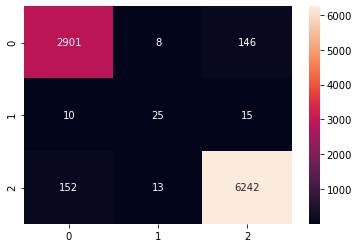

In [68]:
sns.heatmap(confusion_matrix(Y_test,test_pred_dt), annot=True, fmt='d')

## Random Forrest


In [70]:
#build model
rf = RandomForestClassifier(random_state=123)
rf.fit(X_train_scaled, Y_train)

RandomForestClassifier(random_state=123)

In [71]:
#feature importance for Random Forest
features = pd.DataFrame(rf.feature_importances_, columns =['values'])
names = pd.DataFrame(x_t.columns, columns = ['names'])
random_forest_values = names.merge(features, left_index=True, right_index=True)
rt_values= random_forest_values.sort_values('values', ascending=False).reset_index(drop=True)
rt_values.to_csv('random_forest_features.csv',index=False)
rt_values.head()

,names,values
0,gabor_sc7_filter_13,0.0565388451
1,gabor_sc3_filter_13,0.0535423126
2,mean_sc3_mean,0.0454468876
3,gabor_sc3_filter_11,0.0373659966
4,gabor_sc7_filter_14,0.0344705959


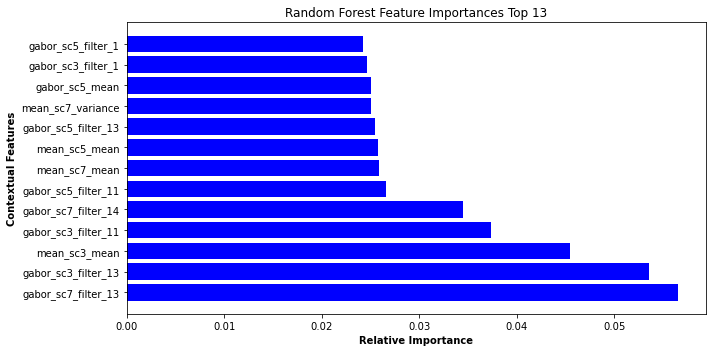

In [72]:
plt.figure(figsize=(10,5))
plt.title('Random Forest Feature Importances Top 13')
plt.barh( rt_values['names'][:13],rt_values['values'][:13], color='b')
#plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

##  Check feature importance of all PCA, Logistic, and Random Forest

In [73]:
# display top 25 features of three reduced models
# PCA
top_pca['PCA_rank']= range(1,len(top_pca)+1)
top_pca.head()

,names,values,PCA_rank
0,gabor_sc3_filter_13,0.2420642272,1
1,sfs_sc71_max_line_length,0.1573266089,2
2,hog_sc7_variance,0.0414379286,3
3,orb_sc51_max,0.0251129670,4
4,sfs_sc71_min_line_length,0.0198164493,5


In [74]:
#random forest values
rt_values['RT_rank']= range(1,len(rt_values)+1)
rt_values.head()

,names,values,RT_rank
0,gabor_sc7_filter_13,0.0565388451,1
1,gabor_sc3_filter_13,0.0535423126,2
2,mean_sc3_mean,0.0454468876,3
3,gabor_sc3_filter_11,0.0373659966,4
4,gabor_sc7_filter_14,0.0344705959,5


In [91]:
# Logistic models
best_logistic['Logistic_rank']= range(1,len(best_logistic)+1)
top_logistic = best_logistic[['Contextual_features','values', 'Logistic_rank']].rename(columns={'Contextual_features':'names'})
top_logistic.head()

,names,values,Logistic_rank
0,gabor_sc7_filter_13,6.9462995674,1
1,gabor_sc7_filter_14,6.5330829333,2
2,lbpm_sc7_max,6.1871378061,3
3,gabor_sc5_filter_8,5.5752222993,4
4,fourier_sc71_mean,5.3389038113,5


In [92]:
# combine all dataframes
best = [top_pca,rt_values,top_logistic]
feature_assessment = reduce(lambda left,right: pd.merge(left,right,on='names'), best)
feature_assessment['overall_value'] = feature_assessment['PCA_rank']+ feature_assessment['RT_rank']+ feature_assessment['Logistic_rank']
feature_assessment= feature_assessment.reset_index(drop=True)
feature_assessment.sort_values('overall_value').head(20)

,names,values_x,PCA_rank,values_y,RT_rank,values,Logistic_rank,overall_value
22,gabor_sc7_filter_14,0.0096184568,15,0.0344705959,5,6.5330829333,2,22
62,gabor_sc7_filter_13,0.0033584262,50,0.0565388451,1,6.9462995674,1,52
5,hog_sc7_variance,0.0414379286,3,0.0062240495,38,1.9042194236,33,74
51,mean_sc5_variance,0.0045974254,40,0.0095147810,30,2.8710436863,18,88
10,lsr_sc31_line_length,0.0133957326,7,0.0035705745,57,1.9898424947,31,95
71,gabor_sc5_filter_10,0.0028811093,57,0.0075401000,33,4.5627851471,9,99
52,mean_sc5_variance,0.0029094728,55,0.0095147810,30,2.8710436863,18,103
11,lbpm_sc7_variance,0.0133788598,8,0.0025476312,76,2.8696562730,19,103
25,mean_sc7_variance,0.0085543666,18,0.0250785763,10,0.2577426895,77,105
17,lac_sc7_lac,0.0104822419,12,0.0039011579,52,0.8007261527,54,118


In [93]:
# clean up feature importance dataframe
feature_assessment[['Contextual_feature']] = feature_assessment['names'].str.split('_',2)

fa = pd.DataFrame(feature_assessment["Contextual_feature"].to_list(), columns=['Contextual_Feature', 'measure',
                                                                         'method'])
frames = [feature_assessment,fa]
feature_assessment = pd.concat(frames, axis=1)
del feature_assessment['Contextual_feature']
feature_assessment.sort_values('overall_value').head()

,names,values_x,PCA_rank,values_y,RT_rank,values,Logistic_rank,overall_value,Contextual_Feature,measure,method
22,gabor_sc7_filter_14,0.0096184568,15,0.0344705959,5,6.5330829333,2,22,gabor,sc7,filter_14
62,gabor_sc7_filter_13,0.0033584262,50,0.0565388451,1,6.9462995674,1,52,gabor,sc7,filter_13
5,hog_sc7_variance,0.0414379286,3,0.0062240495,38,1.9042194236,33,74,hog,sc7,variance
51,mean_sc5_variance,0.0045974254,40,0.0095147810,30,2.8710436863,18,88,mean,sc5,variance
10,lsr_sc31_line_length,0.0133957326,7,0.0035705745,57,1.9898424947,31,95,lsr,sc31,line_length


## SVM

In [94]:
svm = SVC(random_state=42, kernel= 'linear')
svm.fit(X_train_scaled, Y_train)

SVC(kernel='linear', random_state=42)

<AxesSubplot:>

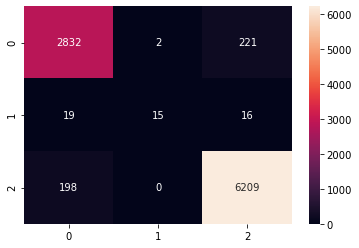

In [95]:
predictionsvm = svm.predict(X_test_scaled)
sns.heatmap(confusion_matrix(Y_test,predictionsvm), annot=True, fmt='d')

In [96]:
print(classification_report(Y_test,predictionsvm))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      3055
           1       0.88      0.30      0.45        50
           2       0.96      0.97      0.97      6407

    accuracy                           0.95      9512
   macro avg       0.92      0.73      0.78      9512
weighted avg       0.95      0.95      0.95      9512



In [97]:
svm_values = pd.DataFrame(svm.coef_[0], columns=['values'])
svm_values.head()

,values
0,-0.3511412638
1,0.4548190499
2,0.0397590662
3,0.5032350860
4,-0.0982746880


In [98]:
svm_0 = names.merge(svm_values, left_index=True, right_index=True)
svm = svm_0.reset_index(drop=True)
svm['abs_values'] = svm['values'].abs()
best_svm= svm.sort_values('abs_values', ascending=False).reset_index(drop=True)
best_svm.to_csv('best_svm_features.csv',index=False)
best_svm.head()

,names,values,abs_values
0,hog_sc7_mean,-2.0952108698,2.0952108698
1,gabor_sc3_filter_6,-1.4469533817,1.4469533817
2,gabor_sc3_variance,1.2845474376,1.2845474376
3,sfs_sc51_max_line_length,-1.0909069107,1.0909069107
4,lbpm_sc7_max,-1.0628631001,1.0628631001


In [118]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 2)
classifier.fit(X_train_scaled, Y_train)

KNeighborsClassifier(n_neighbors=2)

In [119]:
y_pred = classifier.predict(X_test)

In [120]:
print(classification_report(Y_test,y_pred))

              precision    recall  f1-score   support

           0       0.32      1.00      0.49      3055
           1       0.00      0.00      0.00        50
           2       0.92      0.01      0.03      6407

    accuracy                           0.33      9512
   macro avg       0.42      0.34      0.17      9512
weighted avg       0.73      0.33      0.17      9512



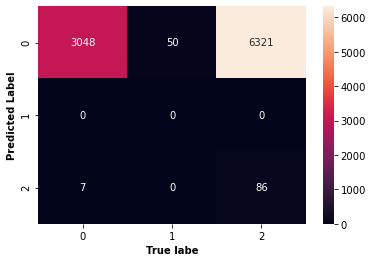

In [121]:
plt.figure()
sns.heatmap(metrics.confusion_matrix(y_pred, Y_test),annot=True,linecolor='blue', fmt='d')
plt.xlabel('True labe')
plt.ylabel('Predicted Label')
plt.show()

(38048, 1)

# Clusering Algorithms- All Features- All Values

In [122]:
from sklearn.manifold import TSNE

In [123]:
fashion_tsne = TSNE(random_state=123, learning_rate= 10).fit_transform(X_train_scaled)
ts = pd.DataFrame()
ts["y"] = Y_train['Label'].tolist()
ts["comp-1"] = fashion_tsne[:,0]
ts["comp-2"] = fashion_tsne[:,1]

[Text(0.5, 1.0, 'Contextual Features Data T-SNE Projection- All Features- All Values')]

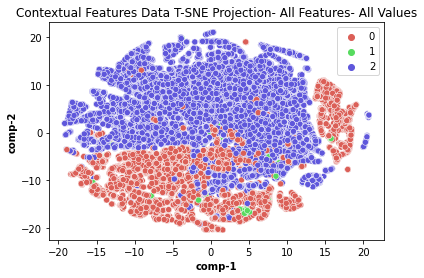

In [124]:
sns.scatterplot(x="comp-1", y="comp-2", hue=ts.y.tolist(),
                palette=sns.color_palette("hls", 3),
                data=ts).set(title="Contextual Features Data T-SNE Projection- All Features- All Values")

# SOM Clustering- All Features- All Values

In [125]:
from minisom import MiniSom

In [126]:
som_x = X_train.reset_index(drop=True)
som_x_test = X_test.reset_index(drop=True)
som_y = Y_train['Label'].reset_index(drop=True)
som_y_test = Y_test['Label'].reset_index(drop=True)

In [129]:
#scale x train and x test for SOM model
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
Som_x = sc.fit_transform(som_x)
Som_x=pd.DataFrame(Som_x)
Som_x.columns=som_x.columns
Som_x= Som_x.values
Som_x

array([[0.        , 0.67336618, 0.67032443, ..., 0.81627208, 0.59789755,
        0.86239847],
       [0.        , 0.83003947, 0.63072519, ..., 0.93715328, 0.3006788 ,
        0.89990444],
       [0.        , 0.60934995, 0.69561069, ..., 0.71235057, 0.36137643,
        0.81772575],
       ...,
       [0.        , 0.72772909, 0.65267176, ..., 0.84677285, 0.30248078,
        0.84161491],
       [0.        , 0.65775868, 0.67509542, ..., 0.88685075, 0.43178463,
        0.89249881],
       [0.        , 0.47961478, 0.72519084, ..., 0.73308274, 0.27373331,
        0.90946011]])

In [130]:
#scale x train and x test for SOM model
sc = MinMaxScaler(feature_range = (0, 1))
Som_x = sc.fit_transform(som_x)
Som_x=pd.DataFrame(Som_x)
Som_x.columns=som_x.columns
Som_x= Som_x.values
Som_x

array([[0.        , 0.67336618, 0.67032443, ..., 0.81627208, 0.59789755,
        0.86239847],
       [0.        , 0.83003947, 0.63072519, ..., 0.93715328, 0.3006788 ,
        0.89990444],
       [0.        , 0.60934995, 0.69561069, ..., 0.71235057, 0.36137643,
        0.81772575],
       ...,
       [0.        , 0.72772909, 0.65267176, ..., 0.84677285, 0.30248078,
        0.84161491],
       [0.        , 0.65775868, 0.67509542, ..., 0.88685075, 0.43178463,
        0.89249881],
       [0.        , 0.47961478, 0.72519084, ..., 0.73308274, 0.27373331,
        0.90946011]])

circle - Water areas
square - deprived areas
diamond - developed areas


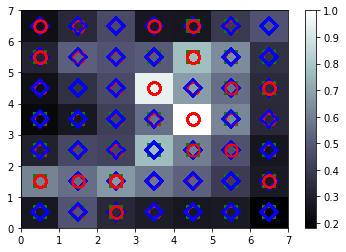

In [131]:
from pylab import plot,axis,show,pcolor,colorbar,bone
som = MiniSom(7,7,144,sigma=1.0,learning_rate=0.05, random_seed=42)
som.random_weights_init(Som_x)
som.train_random(Som_x,100)
print('circle - Water areas')
print('square - deprived areas')
print('diamond - developed areas')
bone()
pcolor(som.distance_map().T) # distance map as background
colorbar()
markers = ['o','s','D']
colors = ['r','g','b']
for cnt,xx in enumerate(Som_x):
 w = som.winner(xx) # getting the winner
 # palce a marker on the winning position for the sample xx
 plot(w[0]+.5,w[1]+.5,markers[som_y[cnt]],markerfacecolor='None',
   markeredgecolor=colors[som_y[cnt]],markersize=12,markeredgewidth=2)
#axis([0,som.weights.shape[0],0,som.weights.shape[1]])
show() # show the figure

UFuncTypeError: ufunc 'subtract' did not contain a loop with signature matching types (dtype('<U32'), dtype('<U32')) -> dtype('<U32')

 [ 100 / 100 ] 100% - 0:00:00 left 
 quantization error: 0.7415341153818149


NameError: name 'som_shape' is not defined

circle - Water areas
square - Deprived areas
diamond - Developed areas


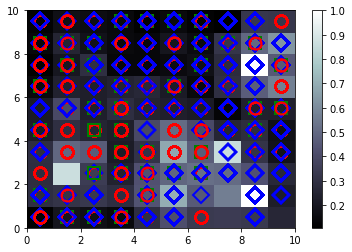

In [142]:
som = MiniSom(10,10,144,sigma=1.0,learning_rate=0.5)
som.random_weights_init(Som_x)
som.train_random(Som_x,100)
print('circle - Water areas')
print('square - Deprived areas')
print('diamond - Developed areas')
bone()
pcolor(som.distance_map().T) # distance map as background
colorbar()
markers = ['o','s','D']
colors = ['r','g','b']

for cnt,xx in enumerate(Som_x):
 w = som.winner(xx) # getting the winner
 # palce a marker on the winning position for the sample xx
 plot(w[0]+.5,w[1]+.5,markers[som_y[cnt]],markerfacecolor='None',
   markeredgecolor=colors[som_y[cnt]],markersize=12,markeredgewidth=2)
#axis([0,som.weights.shape[0],0,som.weights.shape[1]])
show() # show the figure

# K-Means Clustering-All features- All Values 

In [137]:
from sklearn.cluster import KMeans

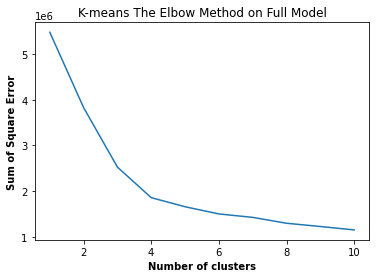

In [138]:
sse = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 123)
    kmeans.fit(X_train_scaled)
    sse.append(kmeans.inertia_)
plt.plot(range(1, 11), sse)
plt.title('K-means The Elbow Method on Full Model')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of Square Error')
plt.show()

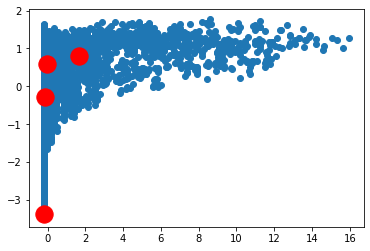

In [139]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=123)
pred_y = kmeans.fit_predict(X_train_scaled)

plt.scatter(X_train_scaled[:,0], X_train_scaled[:,1])
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
plt.show()

## DBSCAN- All Features- All Values

In [143]:
from sklearn.cluster import DBSCAN

In [144]:
clusters= DBSCAN(min_samples=10).fit(X_train_scaled)

In [145]:
clusters_pred = clusters.fit_predict(X_train_scaled)

Text(0.5, 1.0, 'DBSCAN-Full Model- All Features')

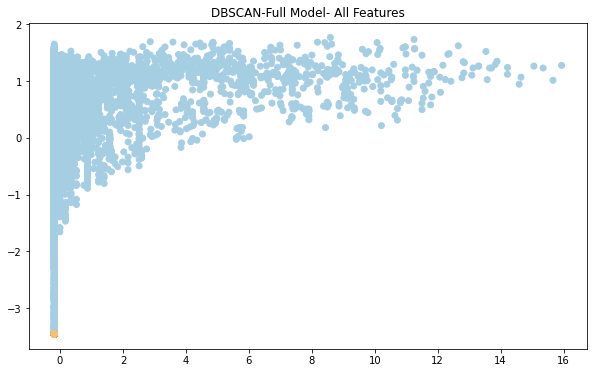

In [146]:
plt.figure(figsize=(10,6))
plt.scatter(X_train_scaled[:,0], X_train_scaled[:,1],c=clusters_pred, cmap='Paired')

plt.title("DBSCAN-Full Model- All Features")

## T-SNE -All Features - Equal Classes 

In [147]:
#convert scaled trained data to dataframe 
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns = names['names'].to_list())
print(X_train_scaled_df.shape)
X_train_scaled_df.head()

(38048, 144)


,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,-0.1823658011,0.0622304224,0.1470278730,0.2246046600,0.2861042705,0.1878941396,0.3277888605,0.3522835800,-0.1811992996,0.1808564628,-0.2027210302,1.1210410330,-0.2218816578,-0.1766230486,-0.1911949967,-0.1943167341,-0.2088510780,-0.1398741837,0.8498959235,0.2304930015,1.1982300557,0.2518294972,0.3292719728,0.2624519163,1.1218224437,-0.1641368093,0.2704076531,-0.2040964439,-0.1928817225,-0.5911709257,-0.1904948098,0.2833393122,0.7418021851,0.1637832719,-0.0723367672,0.3073211558,0.1306014991,-0.1718942102,-0.1994164649,0.3489273414,0.2244675147,0.6499056755,1.1207685099,1.2174071446,0.1484414425,0.0869463586,-0.0474355262,0.0896211827,-0.1419112711,0.0947324845,-0.1707299973,-0.3803169246,-0.4545557036,-0.3849541860,-0.4687860992,-0.3826842380,-0.4480802069,-0.4596131390,-0.3812177184,-0.4758040557,-0.3844947479,-0.4703864559,-0.3855097859,-0.4561053499,-0.3847045848,-0.3776945939,-0.4738807272,-0.3855835830,-0.4539702066,-0.3874763201,-0.4517375194,-0.3913025953,-0.4528006474,-0.4525610395,-0.3904395629,-0.4510572483,-0.3926012927,-0.4547609240,-0.3898420720,-0.4515814196,-0.3894512489,-0.3844818567,-0.4544628869,-0.3939735146,-0.4578618977,-0.3987383021,-0.4558780151,-0.3955720291,-0.4544142805,-0.4534048514,-0.3960076687,-0.4553480855,-0.3971508461,-0.4580361575,-0.3983877934,-0.4582623750,-0.3990066576,-0.3920610514,-0.4503997708,0.4601339453,0.2927610915,0.3859256583,0.3976603600,0.3587338775,-0.

In [148]:
# merge x scaled training and y training to get equal sample size of classes
full_data = Y_train.merge(X_train_scaled_df, left_index=True, right_index=True)
# create dataframe of each class
full_data_2 = full_data[full_data['Label']==2]
full_data_0 = full_data[full_data['Label']==0]
full_data_1 = full_data[full_data['Label']==1]
print(full_data.shape)
print(full_data_2.shape)
print(full_data_0.shape)

(38048, 145)
(25682, 145)
(12147, 145)


In [149]:
#create equal sample dataframe of all classes
df_2_sample= full_data_2.sample(n=219, random_state=123)
df_0_sample = full_data_0.sample(n=219,random_state=123)
# merge sampled majority class with minority class
frames = [df_2_sample, df_0_sample, full_data_1]
df_equal_classes = pd.concat(frames).reset_index(drop=True)
print(df_equal_classes.shape)
print(df_equal_classes['Label'].value_counts())
df_equal_classes.head()

(657, 145)
2    219
1    219
0    219
Name: Label, dtype: int64


,Label,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,2,-0.1823658011,0.2455063374,0.1894877125,0.2576521797,0.3371452715,-0.0660322756,-0.1680784294,-0.2694804298,-0.1811992996,0.1813167842,-0.2027210302,0.4451053778,-0.2218816578,-0.1766230486,-0.1911949967,-0.1943167341,-0.2088510780,-0.1398741837,0.5237826080,0.2353319645,0.3317861296,0.6156064960,-0.2487507256,0.3497230617,0.4459689637,-0.1641368093,0.4857692899,-0.2040964439,-0.1928817225,1.3214465603,-0.1904948098,-0.6223584783,0.4914821077,0.0404065638,0.2940382105,-0.5586307915,0.2671793040,-0.1718942102,-0.1994164649,-0.1700621194,0.2277044442,0.4201289361,0.4453716265,0.3035887396,-0.0693457897,-0.2963149966,-0.3495810006,-0.1962765126,-0.2658267532,-0.1488170425,-0.2326929299,-0.5192579938,-0.6728645498,-0.5193732013,-0.6342714071,-0.5247978991,-0.6456607511,-0.6485594969,-0.5177803473,-0.6518100789,-0.5164648338,-0.6553225167,-0.5157816659,-0.6638875169,-0.5174555732,-0.5249640038,-0.6219293810,-0.5148564898,-0.5459723326,-0.5119184853,-0.5429545747,-0.5191396514,-0.5405791819,-0.5510476979,-0.5107122813,-0.5515874505,-0.5100639893,-0.5502754936,-0.5107395567,-0.5504460440,-0.5096228970,-0.5146070600,-0.5478283020,-0.5141277774,-0.5410853287,-0.5143497690,-0.5379073508,-0.5173118465,-0.5343263091,-0.5460423754,-0.5147795911,-0.5475251449,-0.5135237071,-0.5482596704,-0.5119022806,-0.5456755616,-0.5109429553,-0.5176614315,-0.5452694651,-0.5139867032,0.3432618915,-0.0022355486,-0.3978966

In [150]:
x_sample = df_equal_classes.iloc[:, 1:]
y_sample= df_equal_classes[['Label']]

In [151]:
t_sne_sample = TSNE(random_state=123, learning_rate= 'auto').fit_transform(x_sample)
ts_sample = pd.DataFrame()
ts_sample["y"] = y_sample['Label'].tolist()
ts_sample["comp-1"] = t_sne_sample[:,0]
ts_sample["comp-2"] = t_sne_sample[:,1]

[Text(0.5, 1.0, 'Contextual Features Data T-SNE Projection- All Features- Equal Sample')]

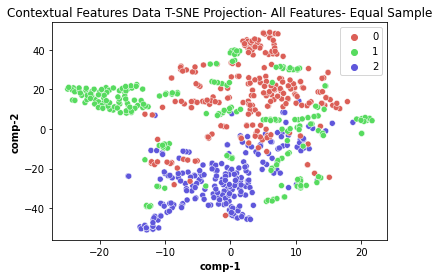

In [152]:
sns.scatterplot(x="comp-1", y="comp-2", hue=ts_sample.y.tolist(),
                palette=sns.color_palette("hls", 3),
                data=ts_sample).set(title="Contextual Features Data T-SNE Projection- All Features- Equal Sample")

## K-means- All Features- Equal Sample

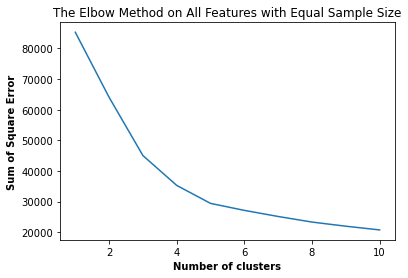

In [153]:
sse = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, random_state = 123)
    kmeans.fit(x_sample)
    sse.append(kmeans.inertia_)
plt.plot(range(1, 11), sse)
plt.title('The Elbow Method on All Features with Equal Sample Size')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of Square Error')
plt.show()

## # DBSCAN - All Features- Equal Sample 

In [154]:
clusters= DBSCAN().fit(x_sample)

In [155]:
clusters_pred = clusters.fit_predict(x_sample)

In [156]:
x_sample.iloc[:,0]
x_sample.head()

,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,-0.1823658011,0.2455063374,0.1894877125,0.2576521797,0.3371452715,-0.0660322756,-0.1680784294,-0.2694804298,-0.1811992996,0.1813167842,-0.2027210302,0.4451053778,-0.2218816578,-0.1766230486,-0.1911949967,-0.1943167341,-0.2088510780,-0.1398741837,0.5237826080,0.2353319645,0.3317861296,0.6156064960,-0.2487507256,0.3497230617,0.4459689637,-0.1641368093,0.4857692899,-0.2040964439,-0.1928817225,1.3214465603,-0.1904948098,-0.6223584783,0.4914821077,0.0404065638,0.2940382105,-0.5586307915,0.2671793040,-0.1718942102,-0.1994164649,-0.1700621194,0.2277044442,0.4201289361,0.4453716265,0.3035887396,-0.0693457897,-0.2963149966,-0.3495810006,-0.1962765126,-0.2658267532,-0.1488170425,-0.2326929299,-0.5192579938,-0.6728645498,-0.5193732013,-0.6342714071,-0.5247978991,-0.6456607511,-0.6485594969,-0.5177803473,-0.6518100789,-0.5164648338,-0.6553225167,-0.5157816659,-0.6638875169,-0.5174555732,-0.5249640038,-0.6219293810,-0.5148564898,-0.5459723326,-0.5119184853,-0.5429545747,-0.5191396514,-0.5405791819,-0.5510476979,-0.5107122813,-0.5515874505,-0.5100639893,-0.5502754936,-0.5107395567,-0.5504460440,-0.5096228970,-0.5146070600,-0.5478283020,-0.5141277774,-0.5410853287,-0.5143497690,-0.5379073508,-0.5173118465,-0.5343263091,-0.5460423754,-0.5147795911,-0.5475251449,-0.5135237071,-0.5482596704,-0.5119022806,-0.5456755616,-0.5109429553,-0.5176614315,-0.5452694651,-0.5139867032,0.3432618915,-0.0022355486,-0.3978966689,0.59

Text(0.5, 1.0, 'DBSCAN-All Features-Equal Sample')

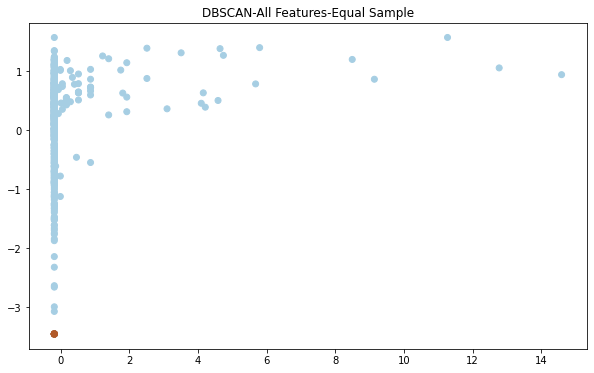

In [157]:
plt.figure(figsize=(10,6))
plt.scatter(x_sample.iloc[:,0], x_sample.iloc[:,1],c=clusters_pred, cmap='Paired')

plt.title("DBSCAN-All Features-Equal Sample")

In [158]:
ex = pd.DataFrame(clusters_pred)
ex.value_counts()

-1    643
 0    14 
dtype: int64

## k-means - Random Forrest Top 50 Features- Equal Sample